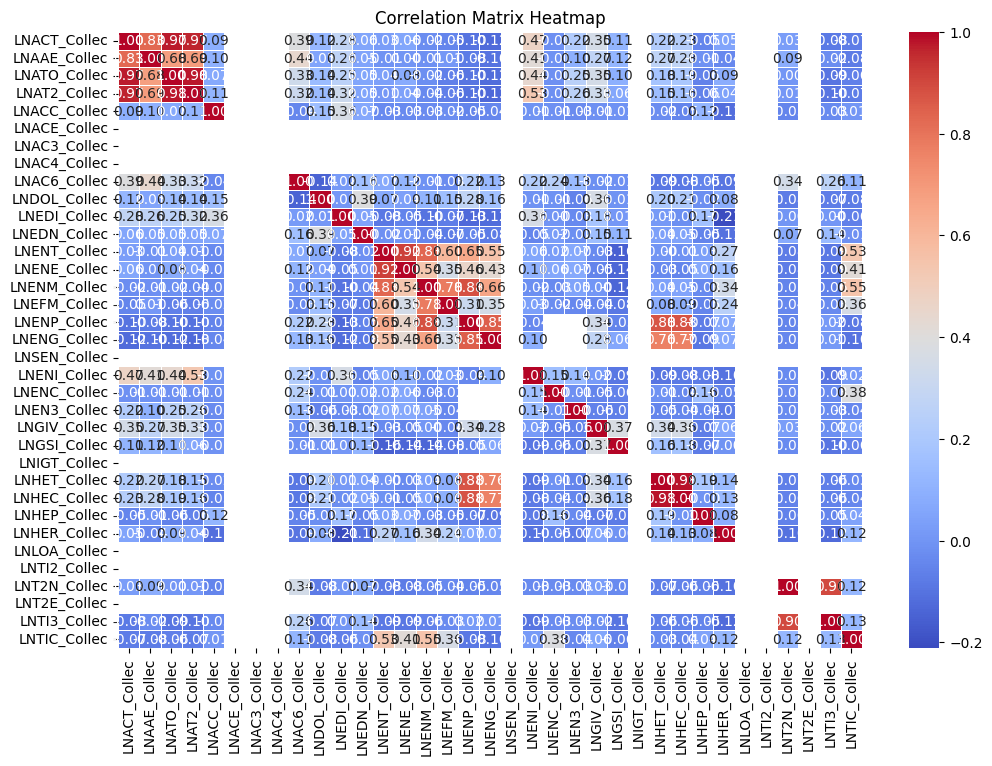

Correlation Matrix:
              LNACT_Collec  LNAAE_Collec  LNATO_Collec  LNAT2_Collec  \
LNACT_Collec      1.000000      0.827108      0.974187      0.965403   
LNAAE_Collec      0.827108      1.000000      0.679209      0.691867   
LNATO_Collec      0.974187      0.679209      1.000000      0.980294   
LNAT2_Collec      0.965403      0.691867      0.980294      1.000000   
LNACC_Collec      0.087528      0.099072      0.071315      0.111502   
LNACE_Collec           NaN           NaN           NaN           NaN   
LNAC3_Collec           NaN           NaN           NaN           NaN   
LNAC4_Collec           NaN           NaN           NaN           NaN   
LNAC6_Collec      0.386889      0.444028      0.328427      0.318273   
LNDOL_Collec      0.124501      0.051164      0.139850      0.138819   
LNEDI_Collec      0.279804      0.262896      0.254391      0.321056   
LNEDN_Collec      0.057213      0.050215      0.054658      0.053367   
LNENT_Collec      0.026410     -0.006455    

In [68]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `data_series_it` contains the time series data as a DataFrame where each column represents a different series.

# Step 1: Calculate the correlation matrix
correlation_matrix = data_series_it.corr()

# Step 2: Visualize the correlation matrix with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

# Step 3: Display the correlation matrix as a DataFrame
print("Correlation Matrix:")
print(correlation_matrix)

# Step 4: Identify pairs of series with high correlation (threshold set to 0.8)
threshold = 0.8
high_correlation_pairs = correlation_matrix.unstack().sort_values(kind="quicksort", ascending=False).drop_duplicates()
high_correlation_pairs = high_correlation_pairs[(high_correlation_pairs > threshold) & (high_correlation_pairs < 1)]

print("\nHighly Correlated Pairs (Threshold > 0.8):")
print(high_correlation_pairs)


# DEPENDENCY

Evaluating dependency between time series can be approached using several techniques, especially when you want to determine the influence of one time series on another. Below are a few commonly used methods to evaluate dependencies between time series: 

### 1. **Granger Causality Test**
   - The Granger causality test is used to determine whether one time series can predict another. If time series \(X\) Granger-causes time series \(Y\), past values of \(X\) contain information that helps predict \(Y\) beyond the information contained in past values of \(Y\) alone.

### 2. **Cross-Correlation Function (CCF)**
   - Cross-correlation measures the similarity between two time series as a function of the time-lag applied to one of them. This is useful to identify leading and lagging relationships between series.

### 3. **Vector Autoregression (VAR)**
   - VAR models capture the linear interdependencies among multiple time series. By fitting a VAR model, you can observe how each series influences the others and analyze the impulse response functions.

### 4. **Cointegration Test**
   - Cointegration is used to determine if two or more time series are linked by a common stochastic trend, meaning they move together in the long run.

### 5. **Dynamic Time Warping (DTW)**
   - DTW is a method that computes an optimal alignment between two time series, which can be used to identify similarities in shape between series that may not be synchronized in time.

Here’s how you can implement these techniques using Python:


### 1. **Granger Causality Test**

In [70]:
from statsmodels.tsa.stattools import grangercausalitytests

# Example: Testing Granger Causality between all pairs of time series
max_lag = 5  # Define the maximum number of lags to test

for col1 in data_series_it.columns:
    for col2 in data_series_it.columns:
        if col1 != col2:
            print(f'Granger Causality Test between {col1} and {col2}')
            grangercausalitytests(data_series_it[[col1, col2]], max_lag=max_lag, verbose=True)


Granger Causality Test between LNACT_Collec and LNAAE_Collec


TypeError: grangercausalitytests() got an unexpected keyword argument 'max_lag'

In [72]:
from statsmodels.tsa.api import VAR

# Fit a VAR model on the time series data
model = VAR(data_series_it)
model_fitted = model.fit(maxlags=15, ic='aic')

# Print summary
print(model_fitted.summary())

# Impulse Response Function
irf = model_fitted.irf(10)
irf.plot(orth=False)
plt.show()


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [73]:
from statsmodels.tsa.stattools import coint

# Example: Testing for cointegration between all pairs of time series
for col1 in data_series_it.columns:
    for col2 in data_series_it.columns:
        if col1 != col2:
            coint_stat, p_value, critical_values = coint(data_series_it[col1], data_series_it[col2])
            print(f'Cointegration Test between {col1} and {col2}')
            print(f'Cointegration Test Statistic: {coint_stat}, p-value: {p_value}')
            print(f'Critical Values: {critical_values}')


Cointegration Test between LNACT_Collec and LNAAE_Collec
Cointegration Test Statistic: -11.667052255903918, p-value: 2.205196483332463e-20
Critical Values: [-4.00816129 -3.3972949  -3.08670872]
Cointegration Test between LNACT_Collec and LNATO_Collec
Cointegration Test Statistic: -11.31619072653663, p-value: 1.4593059747204965e-19
Critical Values: [-4.00816129 -3.3972949  -3.08670872]
Cointegration Test between LNACT_Collec and LNAT2_Collec
Cointegration Test Statistic: -11.428149699613522, p-value: 7.94348434855612e-20
Critical Values: [-4.00816129 -3.3972949  -3.08670872]
Cointegration Test between LNACT_Collec and LNACC_Collec
Cointegration Test Statistic: -4.912113039696194, p-value: 0.00023807009334485922
Critical Values: [-4.00816129 -3.3972949  -3.08670872]
Cointegration Test between LNACT_Collec and LNACE_Collec
Cointegration Test Statistic: -4.926613586398102, p-value: 0.00022411836508402457
Critical Values: [-4.00816129 -3.3972949  -3.08670872]
Cointegration Test between LNAC

MissingDataError: exog contains inf or nans

Granger Causality Matrix (p-values):


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


                LNACT_Collec_x  LNAAE_Collec_x  LNATO_Collec_x  \
LNACT_Collec_y          1.0000          0.6357          0.6007   
LNAAE_Collec_y          0.2741          1.0000          0.2792   
LNATO_Collec_y          0.6556          0.6812          1.0000   
LNAT2_Collec_y          0.1457          0.3455          0.1665   
LNACC_Collec_y          0.2637          0.4623          0.3129   
LNACE_Collec_y             NaN             NaN             NaN   
LNAC3_Collec_y             NaN             NaN             NaN   
LNAC4_Collec_y             NaN             NaN             NaN   
LNAC6_Collec_y          0.0000          0.0003          0.0000   
LNDOL_Collec_y             NaN             NaN             NaN   
LNEDI_Collec_y          0.8201          0.2670          0.7648   
LNEDN_Collec_y          0.2454          0.2236          0.3024   
LNENT_Collec_y          0.0000          0.0270          0.0000   
LNENE_Collec_y          0.0001          0.0326          0.0000   
LNENM_Coll

c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


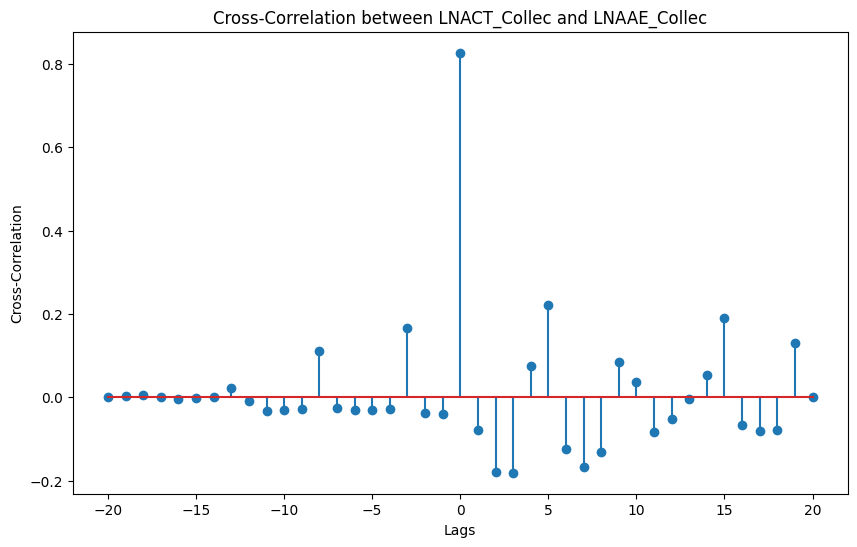

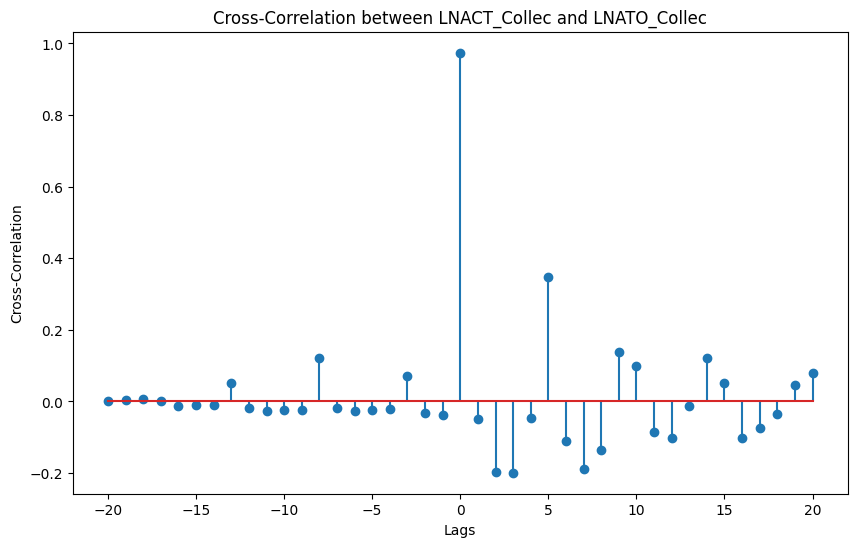

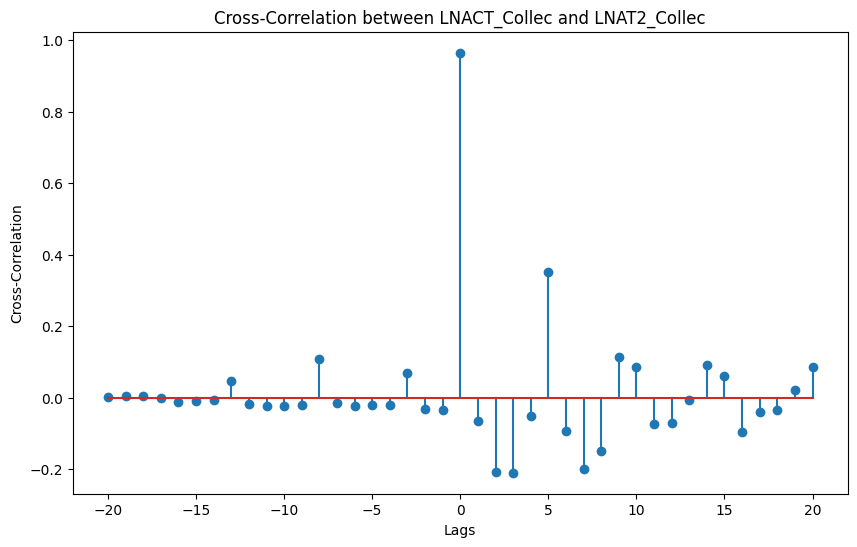

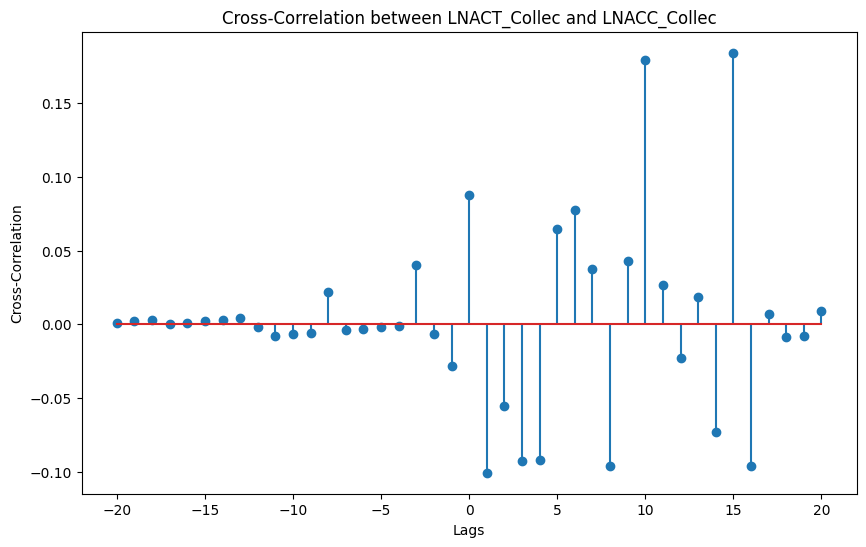

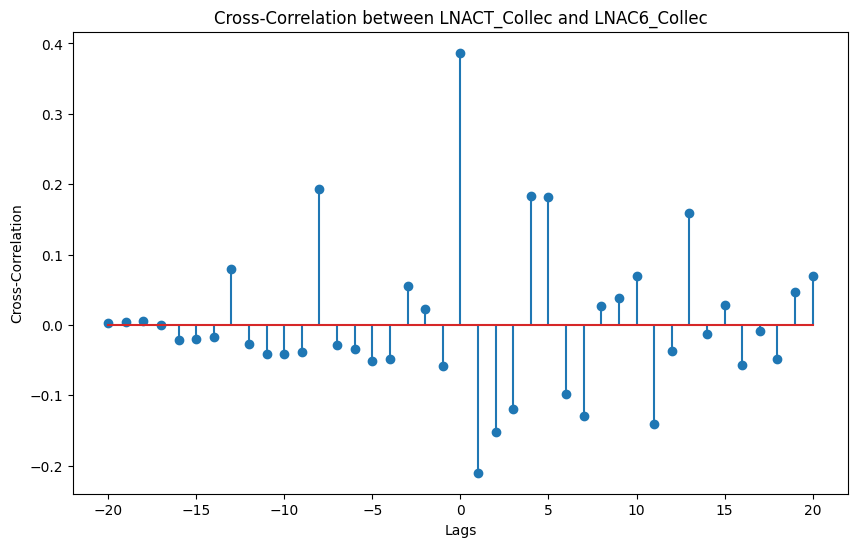

c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\scipy\signal\_signaltools.py:243: RuntimeWarning: Use of fft convolution on input with NAN or inf results in NAN or inf output. Consider using method='direct' instead.
  return convolve(in1, _reverse_and_conj(in2), mode, method)


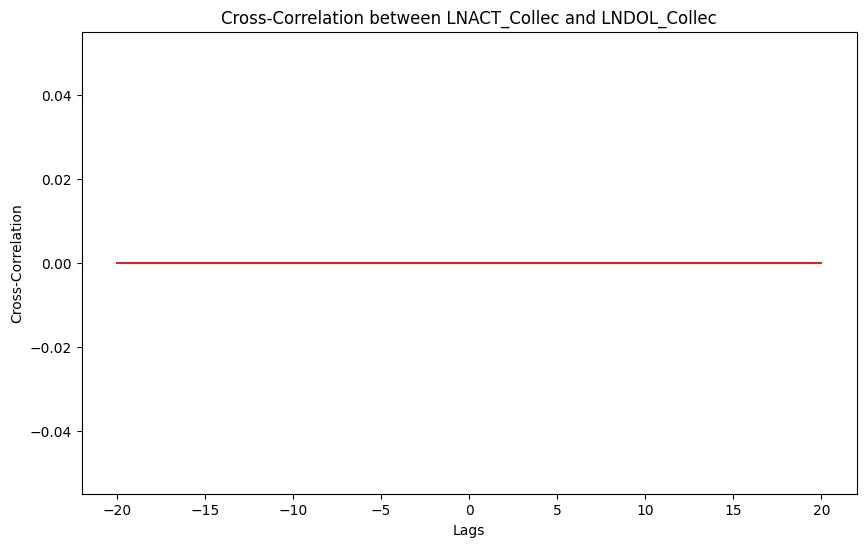

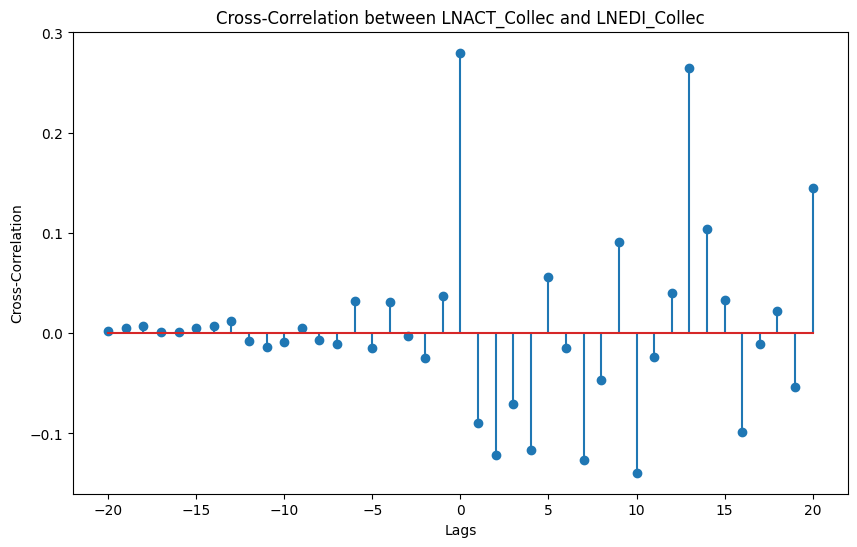

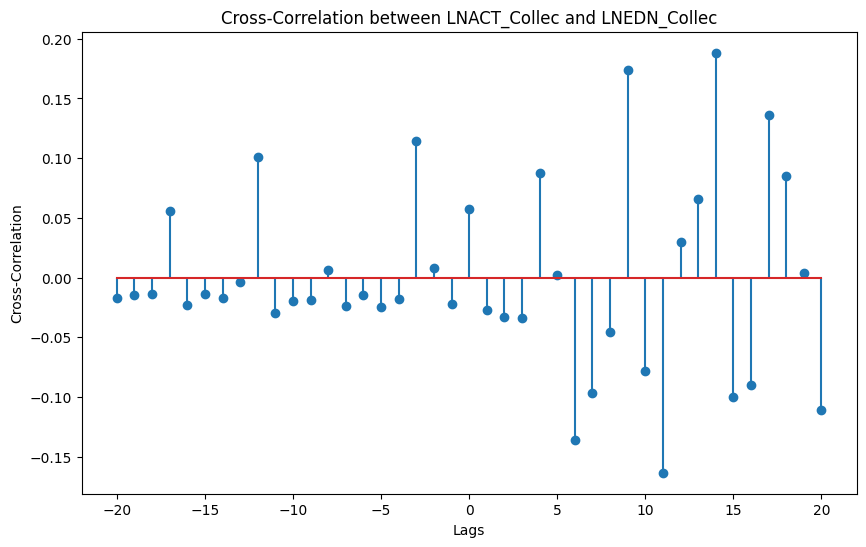

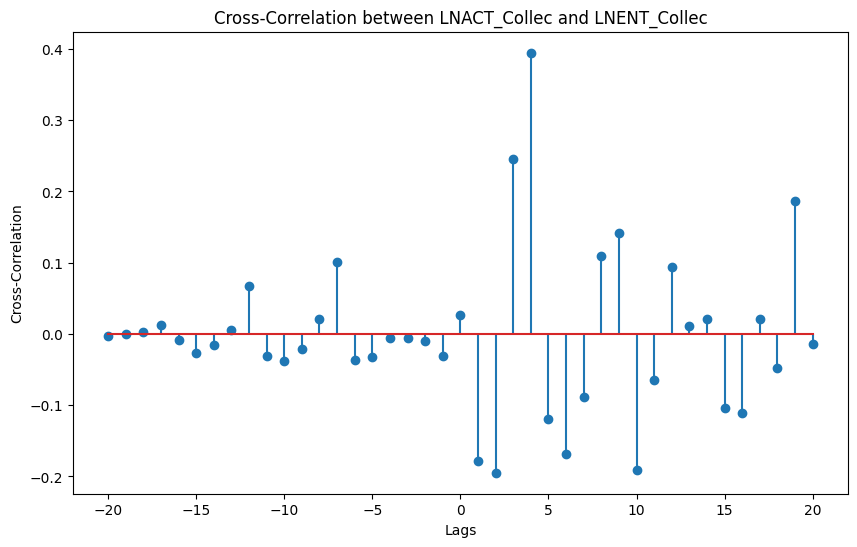

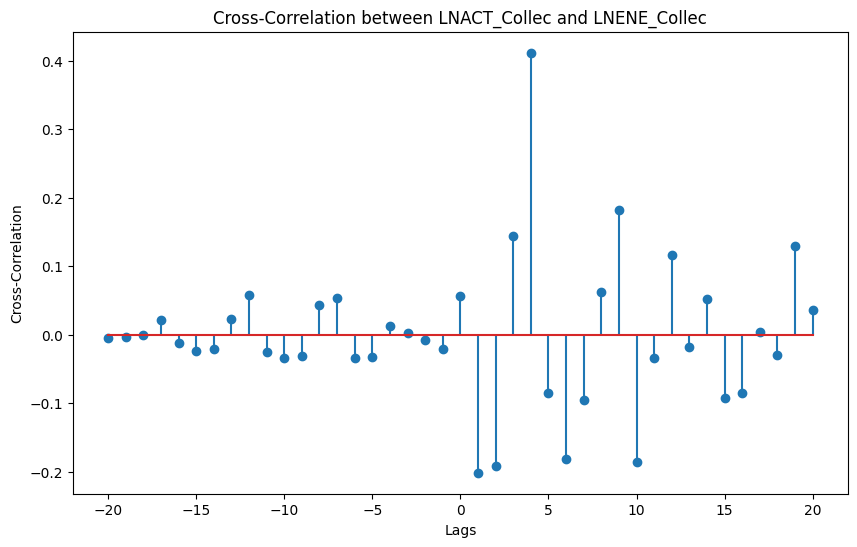

...

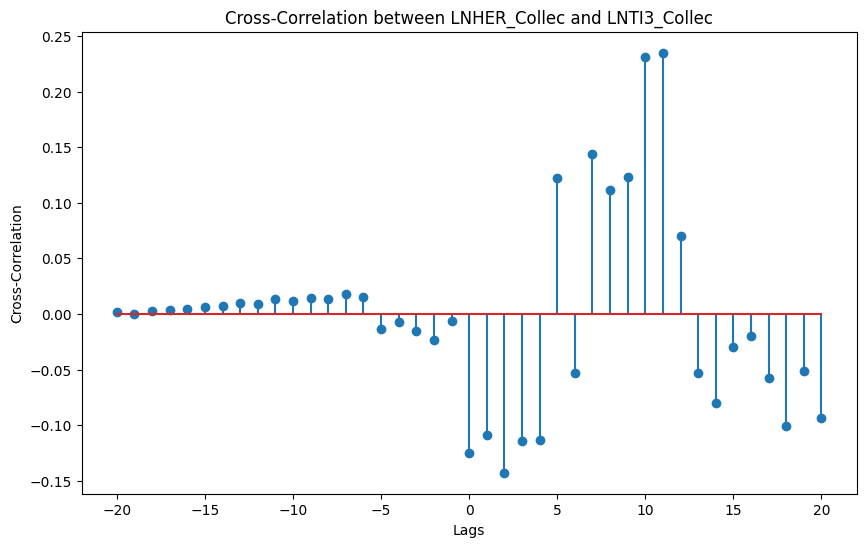

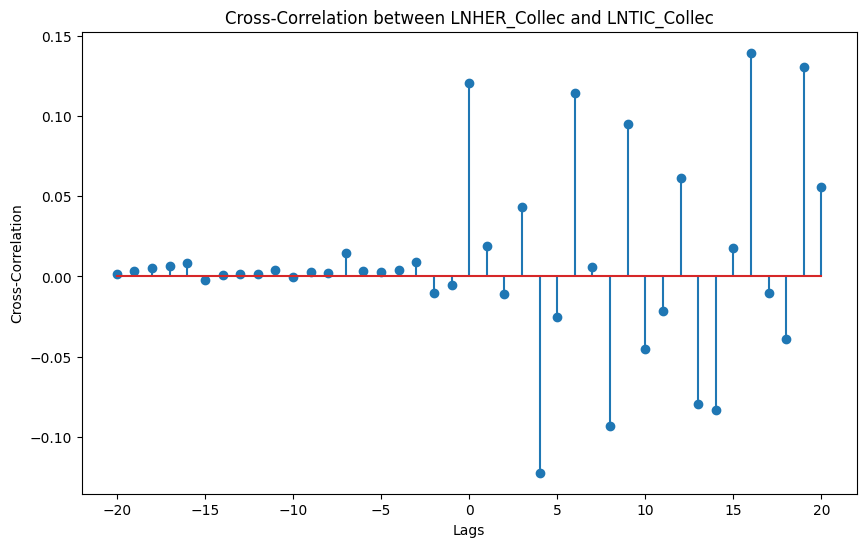

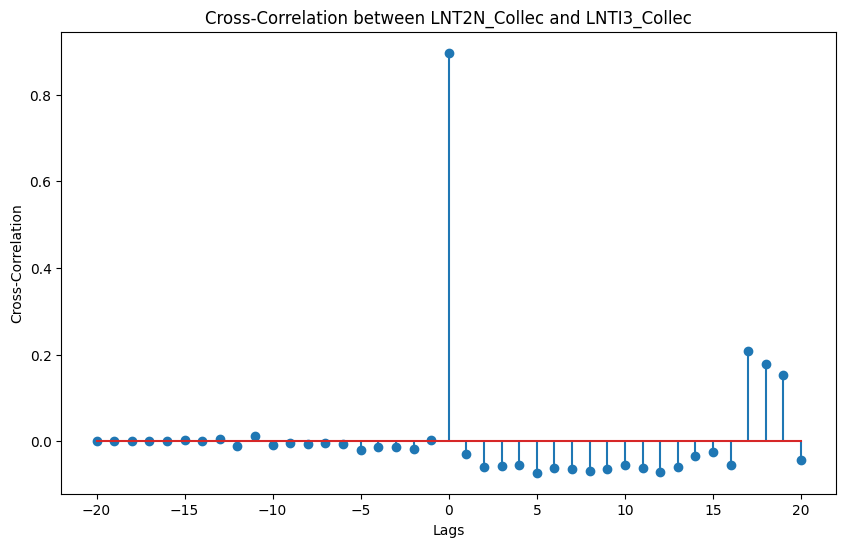

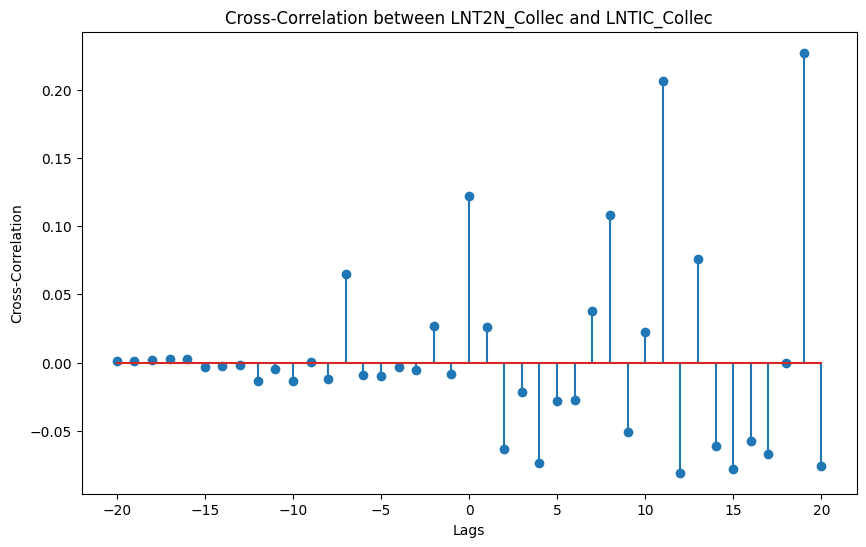

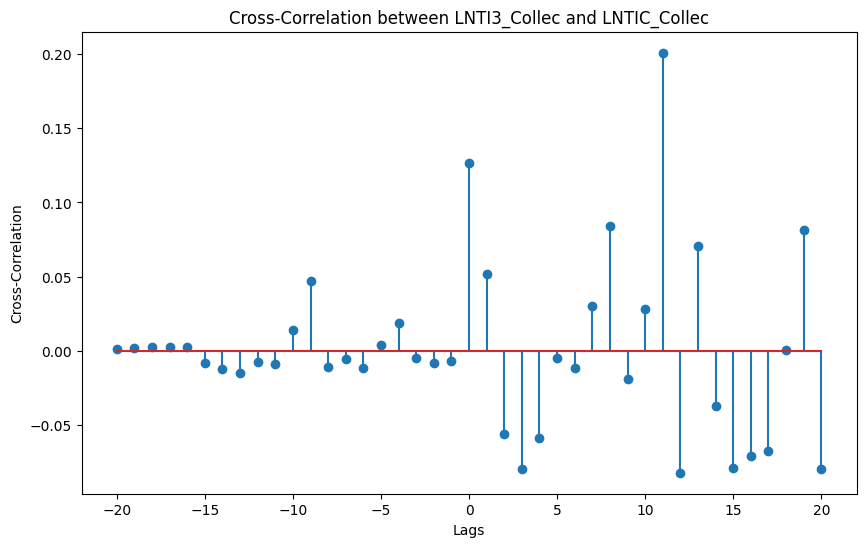

In [77]:
import pandas as pd 
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests
import matplotlib.pyplot as plt

# Function to check if a series is constant or has insufficient variation
def has_variation(series):
    return series.std() > 1e-8  # Adjust the threshold as needed

# Step 1: Granger Causality Test
def granger_causality_matrix(data, maxlag=4):
    variables = data.columns
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    
    for c in df.columns:
        for r in df.index:
            if has_variation(data[r]) and has_variation(data[c]):
                try:
                    test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
                    p_values = [round(test_result[i+1][0]['ssr_chi2test'][1], 4) for i in range(maxlag)]
                    min_p_value = np.min(p_values)
                    df.loc[r, c] = min_p_value
                except (ValueError, np.linalg.LinAlgError) as e:
                    df.loc[r, c] = np.nan
            else:
                df.loc[r, c] = np.nan  # Set to NaN if there is insufficient variation
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

# Step 2: Cross-Correlation Function (CCF)
def plot_cross_correlation(series1, series2, lags=20):
    plt.figure(figsize=(10, 6))
    ccf_values = sm.tsa.stattools.ccf(series1, series2, adjusted=False)
    plt.stem(range(-lags, lags+1), np.concatenate([ccf_values[::-1][:lags], ccf_values[:lags+1]]))
    plt.title(f'Cross-Correlation between {series1.name} and {series2.name}')
    plt.xlabel('Lags')
    plt.ylabel('Cross-Correlation')
    plt.show()

# Step 3: Perform Granger Causality Test on all pairs
print("Granger Causality Matrix (p-values):")
granger_matrix = granger_causality_matrix(data_series_it, maxlag=4)
print(granger_matrix)

# Step 4: Visualize Cross-Correlation for each pair of series
for i, series_name1 in enumerate(data_series_it.columns):
    for j, series_name2 in enumerate(data_series_it.columns):
        if i < j:  # To avoid redundant plots
            if has_variation(data_series_it[series_name1]) and has_variation(data_series_it[series_name2]):
                plot_cross_correlation(data_series_it[series_name1], data_series_it[series_name2])


# TESTS STATISTIQUES

In [80]:
import pandas as pd 
import numpy as np
from statsmodels.stats.diagnostic import acorr_ljungbox

# Définir une fonction pour effectuer le test de Ljung-Box
def ljung_box_test(series, lags=10):
    # Effectuer le test de Ljung-Box
    test_result = acorr_ljungbox(series, lags=[lags], return_df=True)
    p_value = test_result['lb_pvalue'].iloc[0]
    return p_value

# Initialiser un dictionnaire pour stocker les résultats
ljung_box_results = {}

# Appliquer le test de Ljung-Box à chaque série dans les données fournies
for series_name in data_series_it.columns:
    series = data_series_it[series_name].dropna()
    p_value = ljung_box_test(series)
    ljung_box_results[series_name] = p_value
    print(f"Test de Ljung-Box pour {series_name}: p-value = {p_value:.5f}")

# Interpréter les résultats
conclusion = {name: ('Stationnaire' if p_val > 0.05 else 'Non stationnaire') for name, p_val in ljung_box_results.items()}

# Afficher la conclusion
for series_name, status in conclusion.items():
    print(f"La série {series_name} est {status} (p-value = {ljung_box_results[series_name]:.5f})")

# Affichage des résultats sous forme de tableau
result_df = pd.DataFrame(list(ljung_box_results.items()), columns=['Série', 'p-value'])
result_df['Conclusion'] = result_df['p-value'].apply(lambda x: 'Stationnaire' if x > 0.05 else 'Non stationnaire')
print(result_df)


Test de Ljung-Box pour LNACT_Collec: p-value = 0.00028
Test de Ljung-Box pour LNAAE_Collec: p-value = 0.03105
Test de Ljung-Box pour LNATO_Collec: p-value = 0.00173
Test de Ljung-Box pour LNAT2_Collec: p-value = 0.00005
Test de Ljung-Box pour LNACC_Collec: p-value = 0.98669
Test de Ljung-Box pour LNACE_Collec: p-value = nan
Test de Ljung-Box pour LNAC3_Collec: p-value = nan
Test de Ljung-Box pour LNAC4_Collec: p-value = nan
Test de Ljung-Box pour LNAC6_Collec: p-value = 0.00327
Test de Ljung-Box pour LNDOL_Collec: p-value = 0.00005
Test de Ljung-Box pour LNEDI_Collec: p-value = 0.77313
Test de Ljung-Box pour LNEDN_Collec: p-value = 0.96638
Test de Ljung-Box pour LNENT_Collec: p-value = 0.03392
Test de Ljung-Box pour LNENE_Collec: p-value = 0.00860
Test de Ljung-Box pour LNENM_Collec: p-value = 0.96632
Test de Ljung-Box pour LNEFM_Collec: p-value = 0.99424
Test de Ljung-Box pour LNENP_Collec: p-value = 0.99040
Test de Ljung-Box pour LNENG_Collec: p-value = 0.52122
Test de Ljung-Box pour

c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\tsa\stattools.py:693: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


In [81]:
import pandas as pd 
import numpy as np
from scipy.stats import shapiro

# Initialiser un dictionnaire pour stocker les résultats du test de Shapiro-Wilk
shapiro_results = {}

# Appliquer le test de Shapiro-Wilk à chaque série dans les données fournies
for series_name in data_series_it.columns:
    series = data_series_it[series_name].dropna()
    
    # Effectuer le test de Shapiro-Wilk
    stat, p_value = shapiro(series)
    shapiro_results[series_name] = p_value
    
    # Affichage du résultat pour chaque série
    print(f"Test de Shapiro-Wilk pour {series_name}: p-value = {p_value:.5f}")

# Interprétation des résultats
conclusion = {name: ('Normale' if p_val > 0.05 else 'Non normale') for name, p_val in shapiro_results.items()}

# Afficher la conclusion
for series_name, status in conclusion.items():
    print(f"La série {series_name} est {status} (p-value = {shapiro_results[series_name]:.5f})")

# Affichage des résultats sous forme de tableau
result_df = pd.DataFrame(list(shapiro_results.items()), columns=['Série', 'p-value'])
result_df['Conclusion'] = result_df['p-value'].apply(lambda x: 'Normale' if x > 0.05 else 'Non normale')
print(result_df)


Test de Shapiro-Wilk pour LNACT_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNAAE_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNATO_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNAT2_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNACC_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNACE_Collec: p-value = 1.00000
Test de Shapiro-Wilk pour LNAC3_Collec: p-value = 1.00000
Test de Shapiro-Wilk pour LNAC4_Collec: p-value = 1.00000
Test de Shapiro-Wilk pour LNAC6_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNDOL_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNEDI_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNEDN_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNENT_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNENE_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNENM_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNEFM_Collec: p-value = 0.00000
Test de Shapiro-Wilk pour LNENP_Collec: p-value = 0.00000
Test de Shapir

c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


In [82]:
import pandas as pd 
from statsmodels.stats.diagnostic import het_arch

# Initialiser un dictionnaire pour stocker les résultats du test d'ARCH
arch_test_results = {}

# Appliquer le test d'ARCH à chaque série dans les données fournies
for series_name in data_series_it.columns:
    series = data_series_it[series_name].dropna()
    
    # Effectuer le test d'ARCH
    test_statistic, p_value, _, _ = het_arch(series)
    arch_test_results[series_name] = p_value
    
    # Affichage du résultat pour chaque série
    print(f"Test d'ARCH pour {series_name}: p-value = {p_value:.5f}")

# Interprétation des résultats
conclusion = {name: ('Pas d\'hétéroscédasticité conditionnelle' if p_val > 0.05 else 'Présence d\'hétéroscédasticité conditionnelle') 
              for name, p_val in arch_test_results.items()}

# Afficher la conclusion
for series_name, status in conclusion.items():
    print(f"La série {series_name} montre {status} (p-value = {arch_test_results[series_name]:.5f})")

# Affichage des résultats sous forme de tableau
result_df = pd.DataFrame(list(arch_test_results.items()), columns=['Série', 'p-value'])
result_df['Conclusion'] = result_df['p-value'].apply(lambda x: 'Pas d\'hétéroscédasticité conditionnelle' if x > 0.05 else 'Présence d\'hétéroscédasticité conditionnelle')
print(result_df)


Test d'ARCH pour LNACT_Collec: p-value = 0.67944
Test d'ARCH pour LNAAE_Collec: p-value = 0.89079
Test d'ARCH pour LNATO_Collec: p-value = 0.74716
Test d'ARCH pour LNAT2_Collec: p-value = 0.16158
Test d'ARCH pour LNACC_Collec: p-value = 0.97733
Test d'ARCH pour LNACE_Collec: p-value = nan
Test d'ARCH pour LNAC3_Collec: p-value = nan
Test d'ARCH pour LNAC4_Collec: p-value = nan
Test d'ARCH pour LNAC6_Collec: p-value = 0.02444
Test d'ARCH pour LNDOL_Collec: p-value = 0.46341
Test d'ARCH pour LNEDI_Collec: p-value = 0.95937
Test d'ARCH pour LNEDN_Collec: p-value = 0.96155
Test d'ARCH pour LNENT_Collec: p-value = 1.00000
Test d'ARCH pour LNENE_Collec: p-value = 0.87704
Test d'ARCH pour LNENM_Collec: p-value = 1.00000
Test d'ARCH pour LNEFM_Collec: p-value = 1.00000
Test d'ARCH pour LNENP_Collec: p-value = 1.00000
Test d'ARCH pour LNENG_Collec: p-value = 0.70529
Test d'ARCH pour LNSEN_Collec: p-value = nan
Test d'ARCH pour LNENI_Collec: p-value = 0.23420
Test d'ARCH pour LNENC_Collec: p-val

c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\statsmodels\regression\linear_model.py:1783: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
